In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
confirmed = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv')
recovered = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_recovered_global.csv')
deaths = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv')
#population = pd.read_csv('population_by_country_2020.csv')

In [11]:
confirmed2 = confirmed
confirmed2[confirmed['Country/Region'] == 'Italy']

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,5/22/20,5/23/20,5/24/20,5/25/20,5/26/20,5/27/20,5/28/20,5/29/20,5/30/20,5/31/20
137,NaN,Italy,43.0,12.0,0,0,0,0,0,0,...,228658,229327,229858,230158,230555,231139,231732,232248,232664,232997


In [7]:
df1 = confirmed2.transpose()

In [6]:

df1

In [47]:
#confirmed['Province/State'].unique()

In [48]:
confirmed.loc[confirmed.iloc[:,-1] >= 50000]

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,5/21/20,5/22/20,5/23/20,5/24/20,5/25/20,5/26/20,5/27/20,5/28/20,5/29/20,5/30/20
23,NaN,Belgium,50.8333,4.0000,0,0,0,0,0,0,...,56235,56511,56810,57092,57342,57455,57592,57849,58061,58186
28,NaN,Brazil,-14.2350,-51.9253,0,0,0,0,0,0,...,310087,330890,347398,363211,374898,391222,411821,438238,465166,498440
44,Quebec,Canada,52.9399,-73.5491,0,0,0,0,0,0,...,45504,46150,46847,47420,47993,48607,49148,49711,50232,50651
48,NaN,Chile,-35.6751,-71.5430,0,0,0,0,0,0,...,57581,61857,65393,69102,73997,77961,82289,86943,90638,94858
62,Hubei,China,30.9756,112.2707,444,444,549,761,1058,1423,...,68135,68135,68135,68135,68135,68135,68135,68135,68135,68135
116,NaN,France,46.2276,2.2137,0,0,2,3,3,3,...,179306,179645,179964,179859,180166,179887,180044,183309,183816,185616
120,NaN,Germany,51.0000,9.0000,0,0,0,0,0,1,...,179021,179710,179986,180328,180600,181200,181524,182196,182922,183189
131,NaN,India,21.0000,78.0000,0,0,0,0,0,0,...,118226,124794,131423,138536,144950,150793,158086,165386,173491,181827
133,NaN,Iran,32.0000,53.0000,0,0,0,0,0,0,...,129341,131652,133521,135701,137724,139511,141591,143849,146668,148950
137,NaN,Italy,43.0000,12.0000,0,0,0,0,0,0,...,228006,228658,229327,229858,230158,230555,231139,231732,232248,232664


In [49]:
for j in range(2):
    a=confirmed['Country/Region'].tolist()
    b=deaths['Country/Region'].tolist()
    c=recovered['Country/Region'].tolist()
    for k in range(50):
        n = len(a)
        m = len(c)
        if n>m:
            length = m
        elif n<m:
            length = n
        for i in range(length):
            if a[i]!=c[i]:
                if a[i] == c[i+1]:
                    recovered = recovered[recovered['Country/Region']!=c[i]]
                    del c[i]
                    break
                else:
                    confirmed = confirmed[confirmed['Country/Region']!=a[i]]
                    deaths = deaths[deaths['Country/Region']!=b[i]]
                    del a[i]
                    del b[i]
                    break

In [50]:
dates = confirmed.columns.tolist()[4:]
confirmed.reset_index(inplace=True)

In [51]:
dataset = confirmed.loc[:,['Province/State','Country/Region','Lat','Long']]
dataset['confirmed'] = confirmed[dates[-1]]
dataset['recovered'] = recovered[dates[-1]]
dataset['deaths'] = deaths[dates[-1]]

In [52]:
location = dataset.groupby('Country/Region').mean()
cases = dataset.groupby('Country/Region').sum()
Country_wise_cases = location.loc[:,['Lat','Long']]
Country_wise_cases['confirmed'] = cases.confirmed
Country_wise_cases['recovered'] = cases.recovered
Country_wise_cases['deaths'] = cases.deaths

In [53]:
#country_information=population.groupby('Country (or dependency)').sum().reindex(Country_wise_cases.index.tolist()).drop(['Net Change','Migrants (net)'],axis=1)

NameError: name 'population' is not defined

In [ ]:
#country_wise = pd.concat([Country_wise_cases,country_information],axis=1)

In [55]:
#confirmed=confirmed.drop(['index'],axis=1)

KeyError: "['index'] not found in axis"

In [56]:
cc = confirmed.groupby('Country/Region').sum()
tree = [(cc[cc[dates[0]]>0].index.values.tolist())]
for i in range(1,len(dates)):
    l = list(set(cc[cc[dates[i]]>0].index.values.tolist()).difference(set(cc[cc[dates[i-1]]>0].index.values.tolist())))
    for country in l:
        if len(l) != 0:
            tree.append(l)

In [57]:
tree

[['China', 'Japan', 'Korea, South', 'Taiwan*', 'Thailand', 'US'],
 ['Singapore', 'Vietnam'],
 ['Singapore', 'Vietnam'],
 ['France'],
 ['Nepal', 'Malaysia'],
 ['Nepal', 'Malaysia'],
 ['Australia'],
 ['Sri Lanka', 'Cambodia', 'Germany'],
 ['Sri Lanka', 'Cambodia', 'Germany'],
 ['Sri Lanka', 'Cambodia', 'Germany'],
 ['Finland', 'United Arab Emirates'],
 ['Finland', 'United Arab Emirates'],
 ['India', 'Philippines'],
 ['India', 'Philippines'],
 ['United Kingdom', 'Italy', 'Russia', 'Sweden'],
 ['United Kingdom', 'Italy', 'Russia', 'Sweden'],
 ['United Kingdom', 'Italy', 'Russia', 'Sweden'],
 ['United Kingdom', 'Italy', 'Russia', 'Sweden'],
 ['Spain'],
 ['Belgium'],
 ['Diamond Princess'],
 ['Egypt'],
 ['Iran'],
 ['Israel', 'Lebanon'],
 ['Israel', 'Lebanon'],
 ['Bahrain', 'Oman', 'Iraq', 'Kuwait', 'Afghanistan'],
 ['Bahrain', 'Oman', 'Iraq', 'Kuwait', 'Afghanistan'],
 ['Bahrain', 'Oman', 'Iraq', 'Kuwait', 'Afghanistan'],
 ['Bahrain', 'Oman', 'Iraq', 'Kuwait', 'Afghanistan'],
 ['Bahrain', 'Om

In [58]:
for i in range(len(confirmed.columns.tolist())-1,4,-1):
    confirmed.iloc[:,i] = confirmed.iloc[:,i] - confirmed.iloc[:,i-1]
    recovered.iloc[:,i] = recovered.iloc[:,i] - recovered.iloc[:,i-1]
    deaths.iloc[:,i] = deaths.iloc[:,i] - deaths.iloc[:,i-1]

In [59]:
zc = confirmed.groupby(['Country/Region','Province/State']).sum()
zr = recovered.groupby(['Country/Region','Province/State']).sum()
zd = deaths.groupby(['Country/Region','Province/State']).sum()
confirmedt = zc.transpose()
recoveredt = zr.transpose()
deathst = zd.transpose()
idx = confirmedt.columns.tolist()

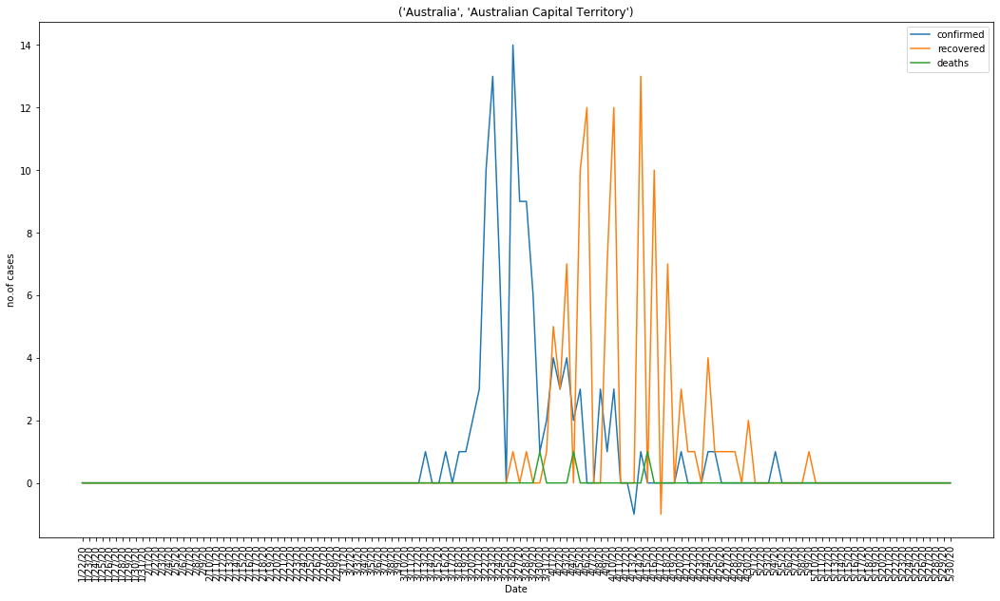

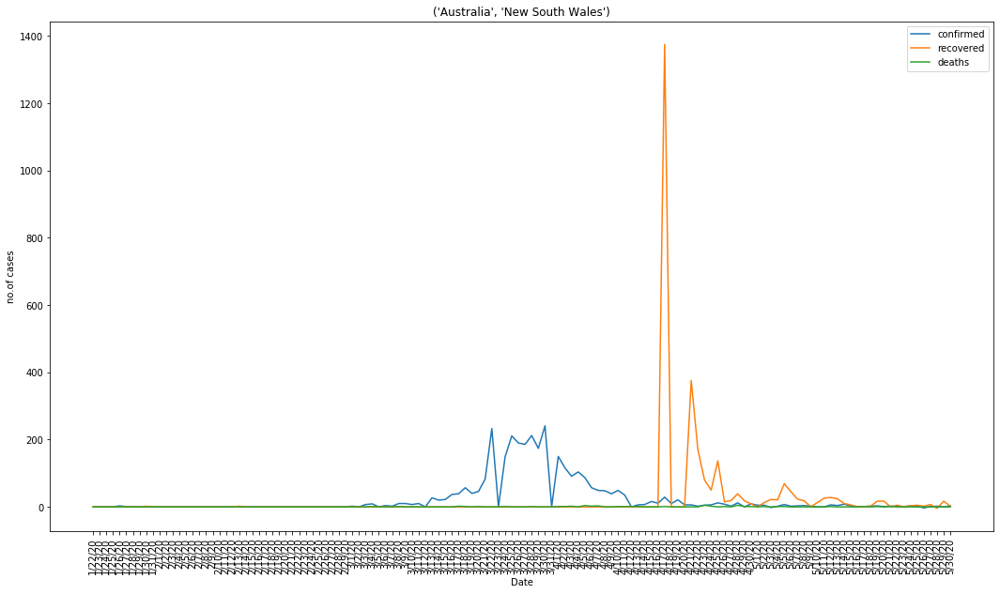

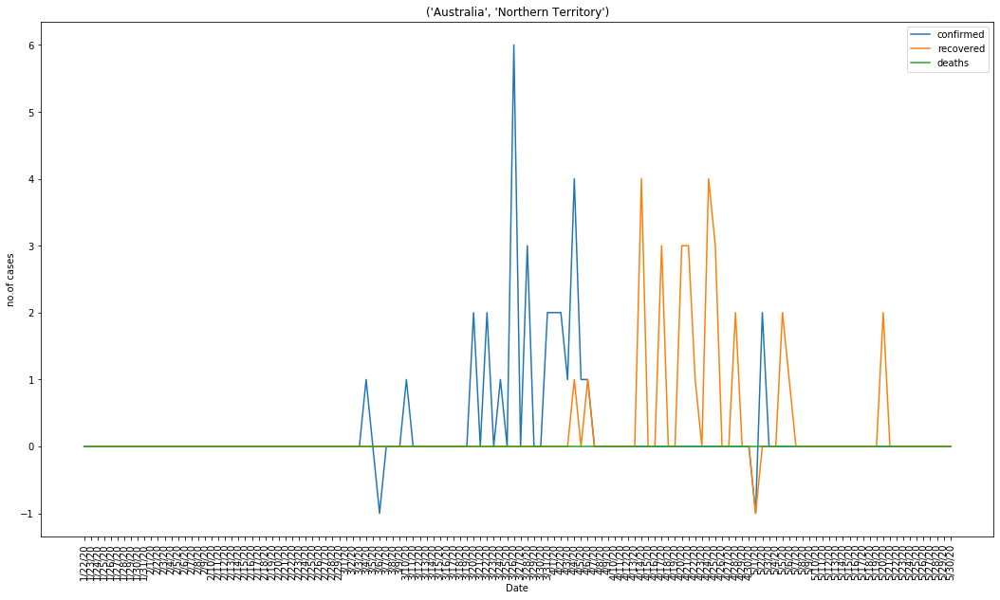

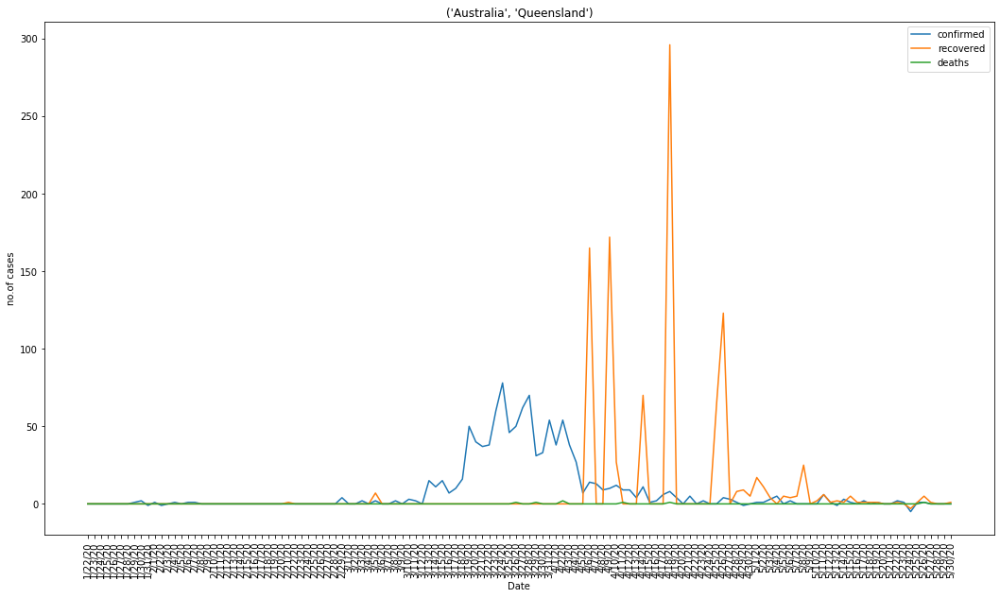

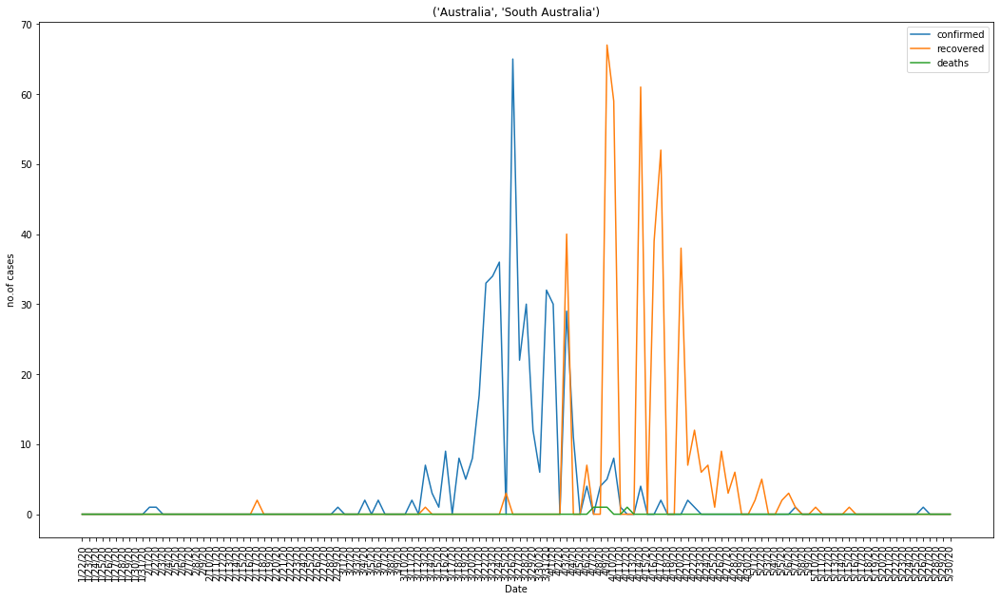

...

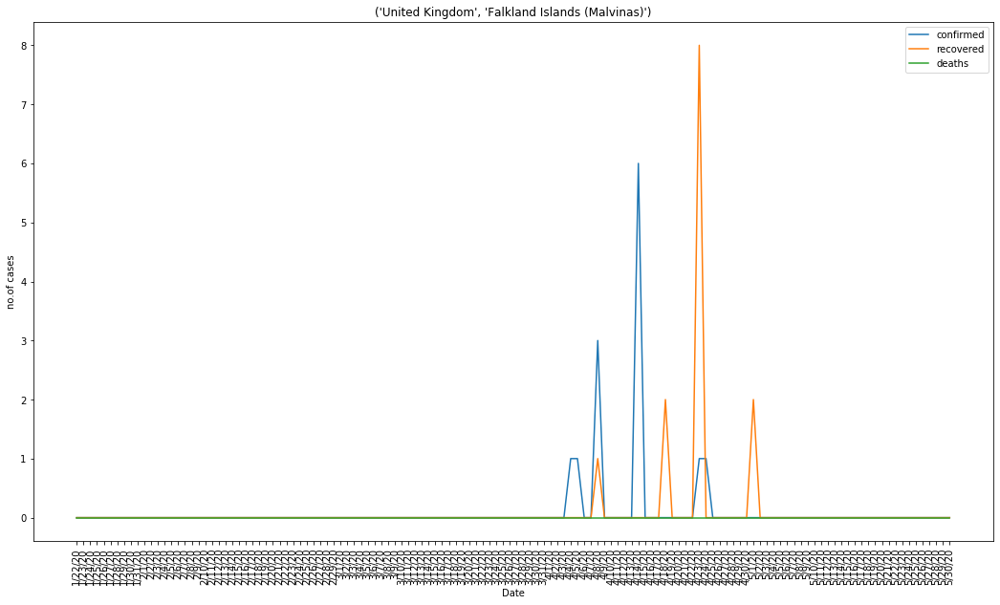

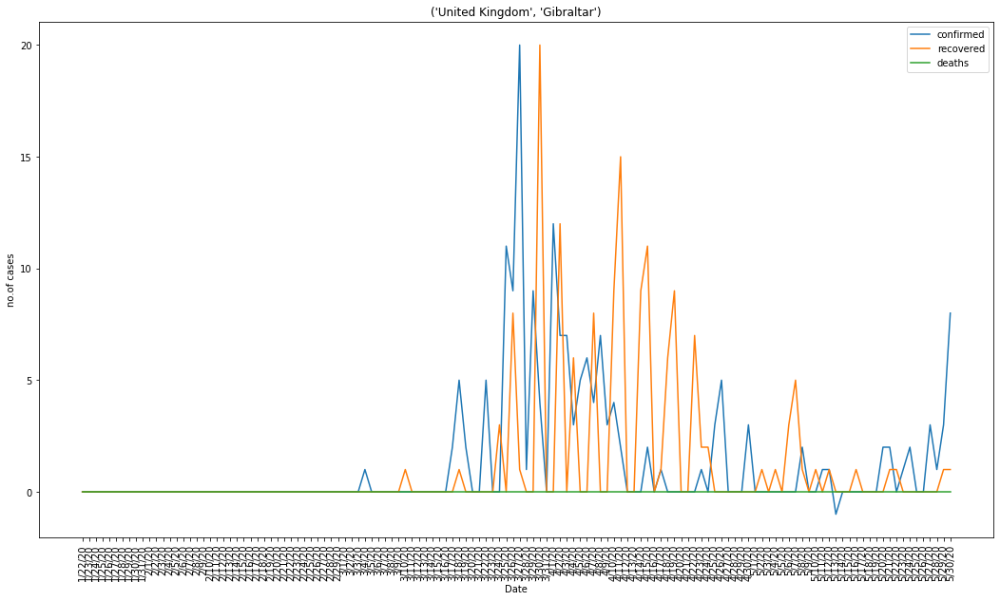

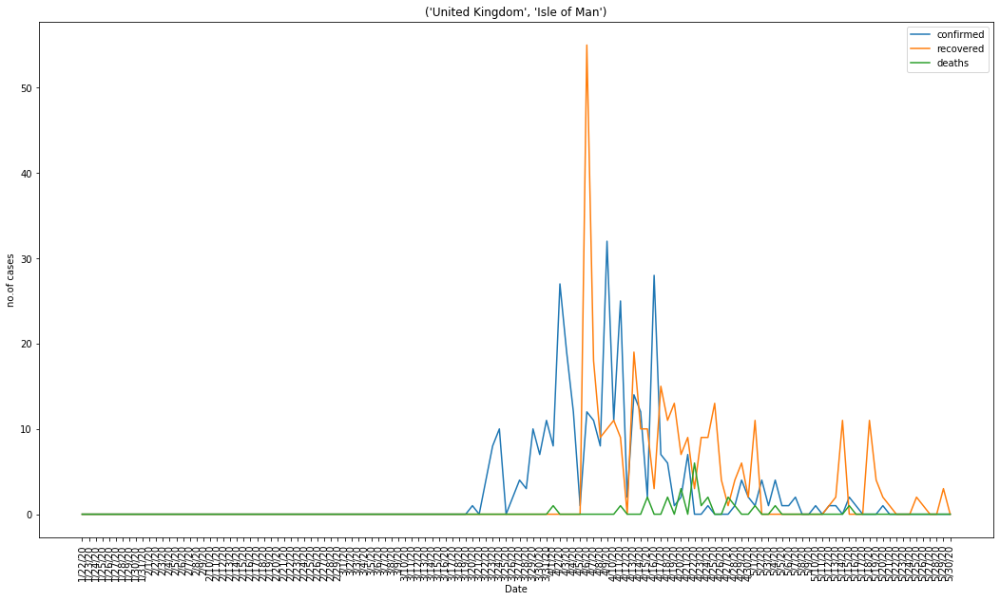

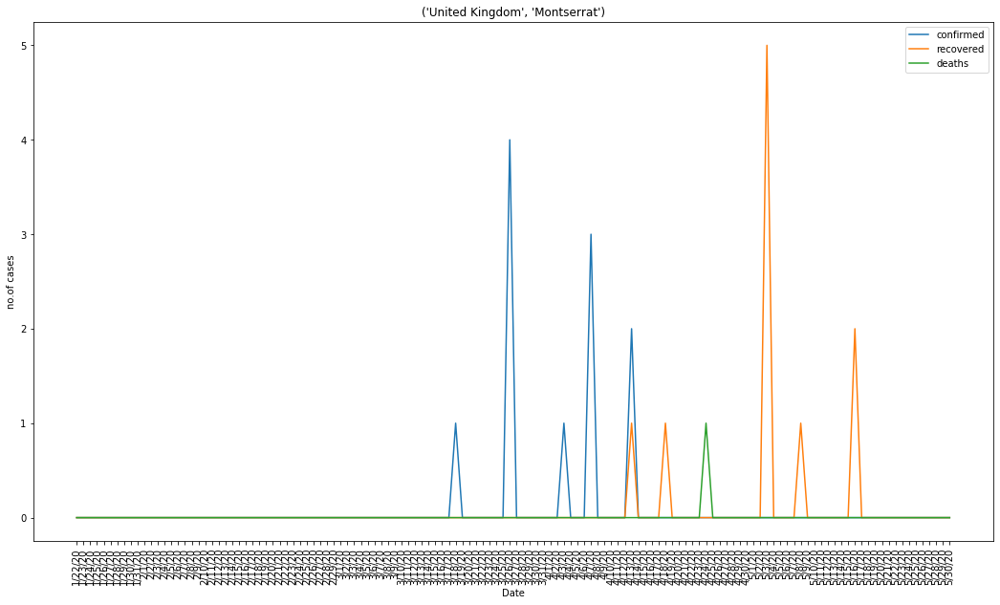

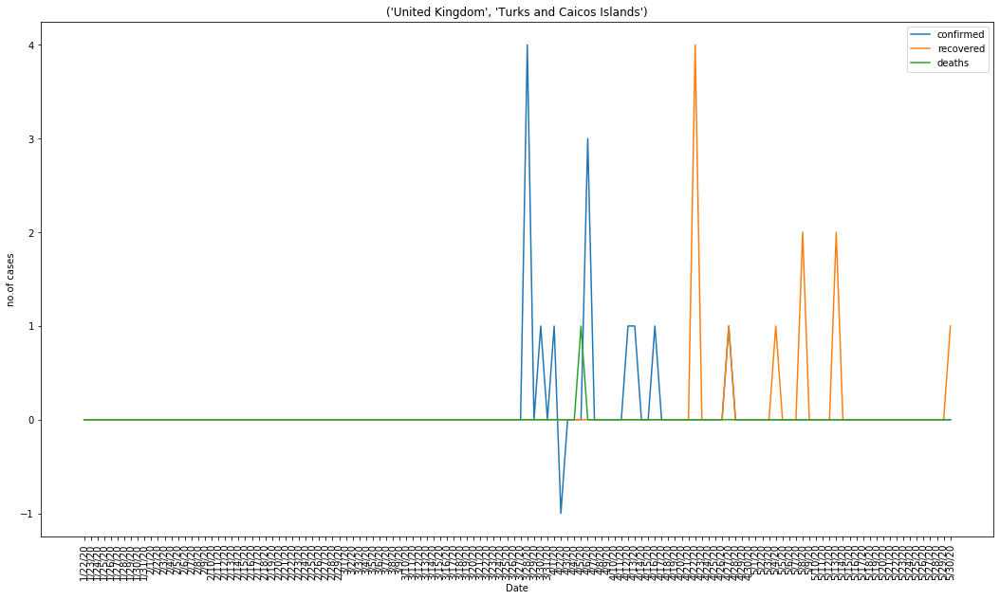

In [66]:

for i in idx:
    plt.figure(figsize=(18,10))
    plt.plot(dates,confirmedt.loc[:,i][2:])
    plt.plot(dates,recoveredt.loc[:,i][2:])
    plt.plot(dates,deathst.loc[:,i][2:])
    plt.xticks(rotation=90);
    plt.legend(['confirmed','recovered','deaths'])
    plt.xlabel('Date')
    plt.ylabel('no.of cases')
    plt.title(i);
    plt.savefig(str(i)+'.png')
    

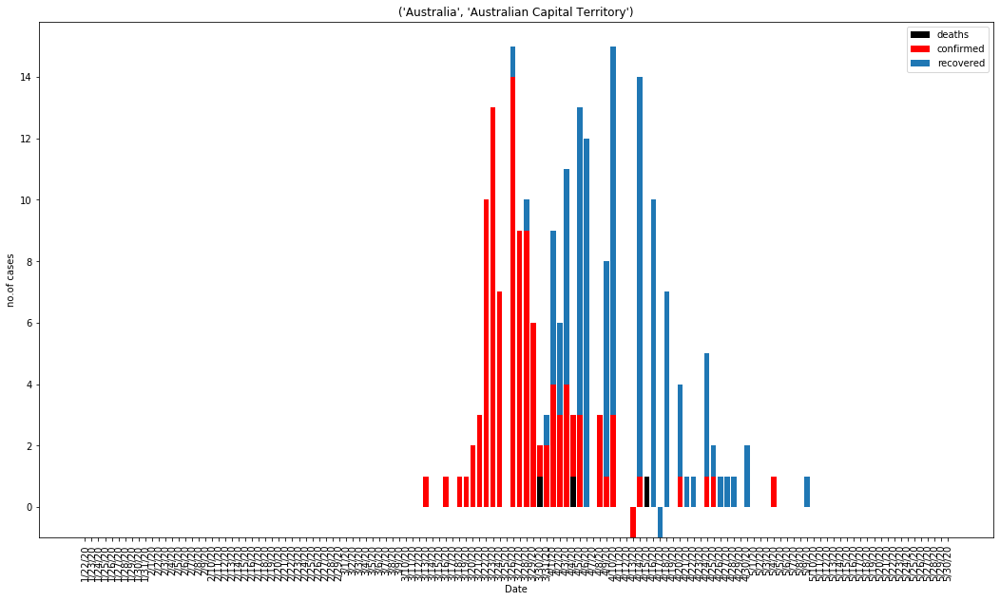

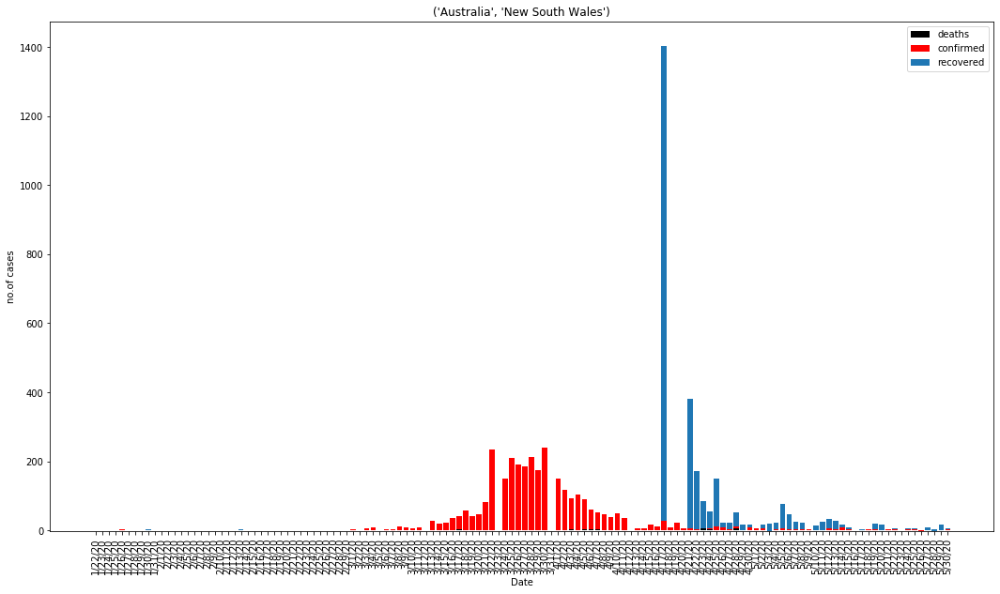

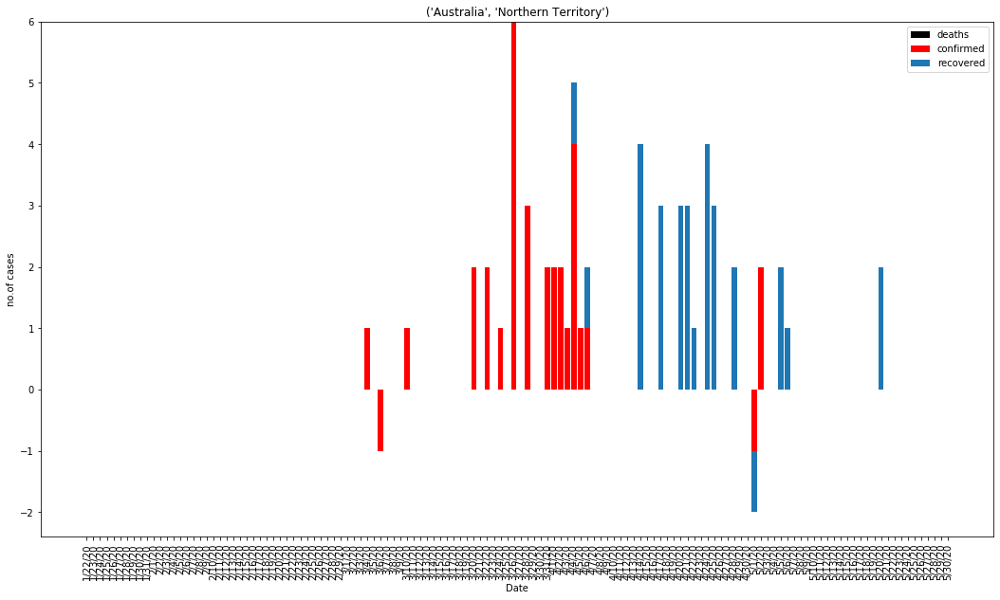

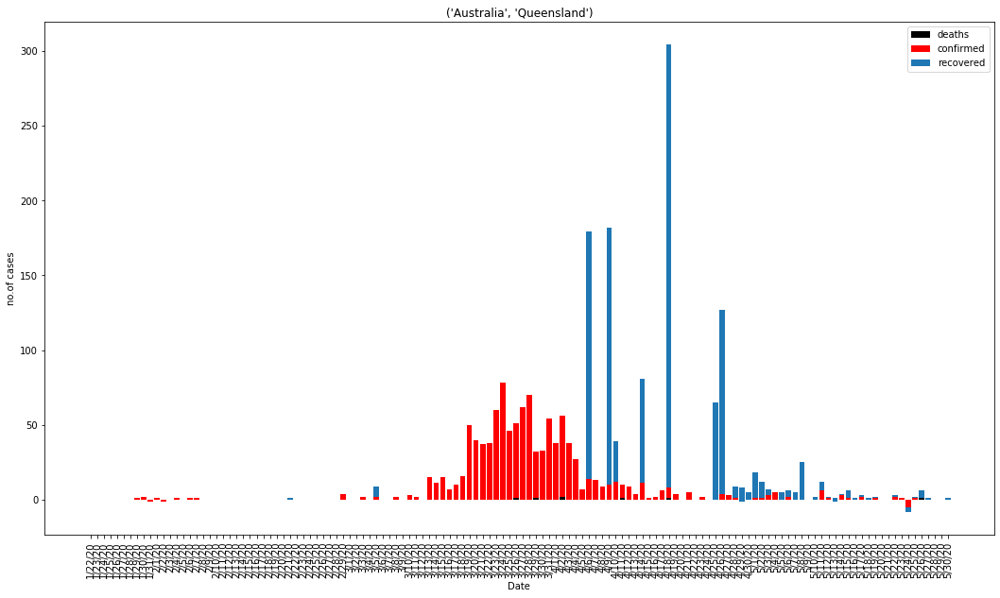

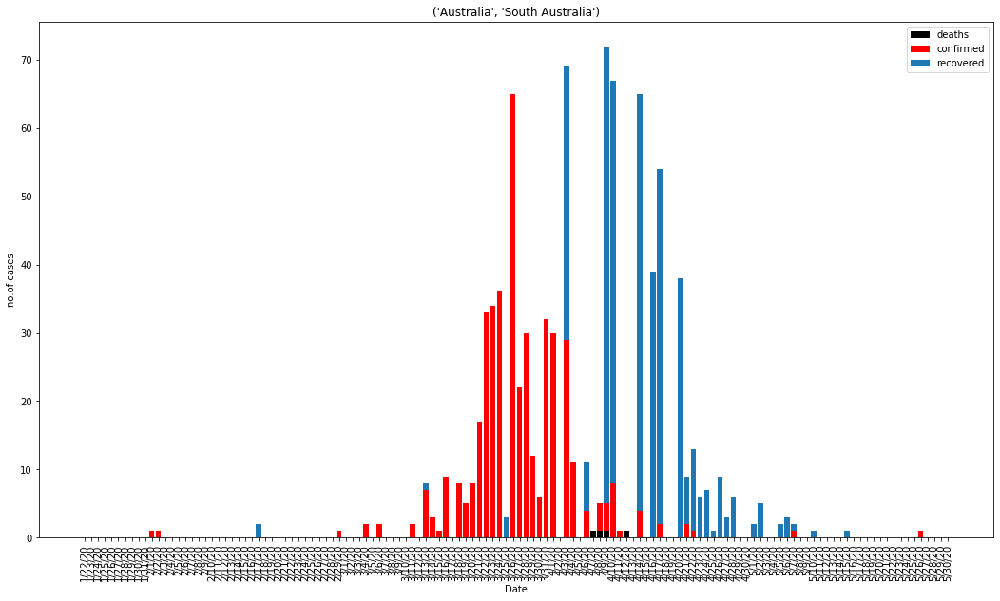

...

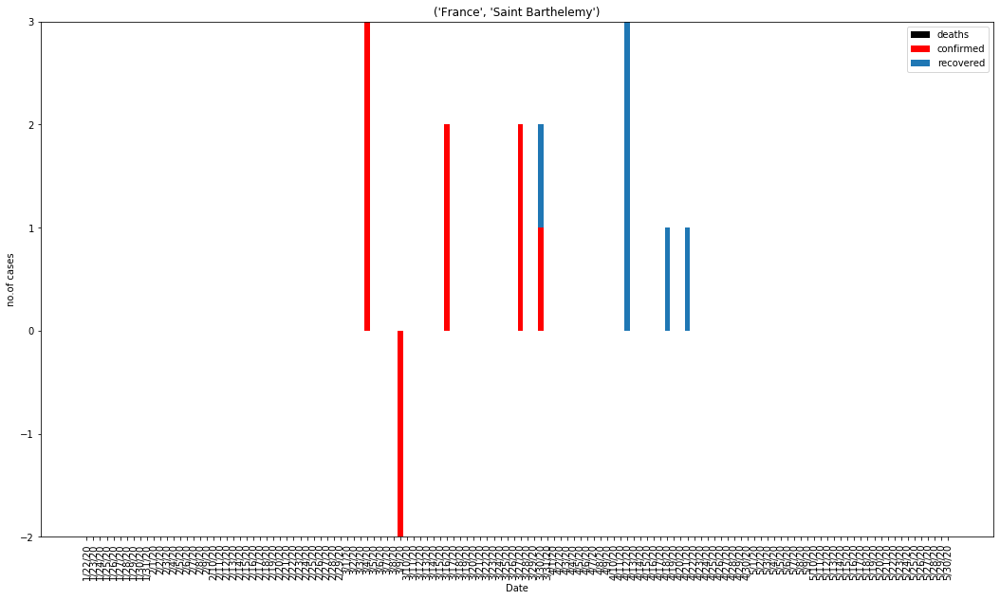

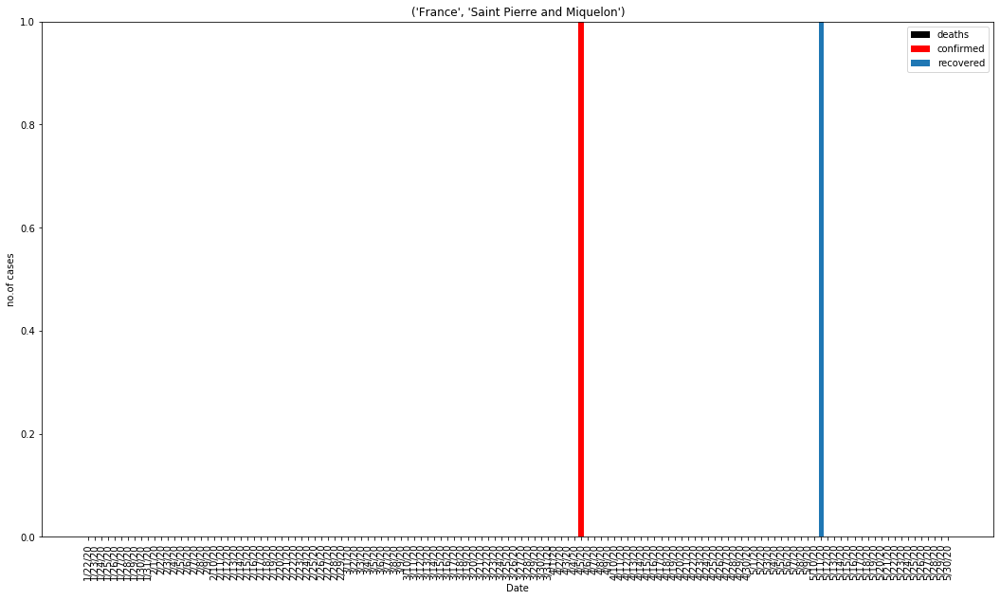

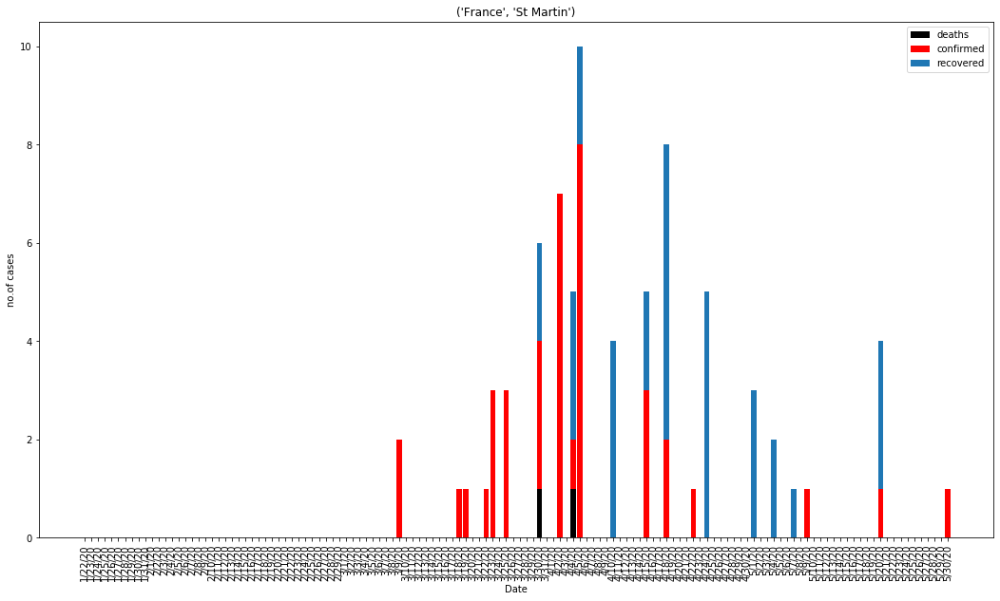

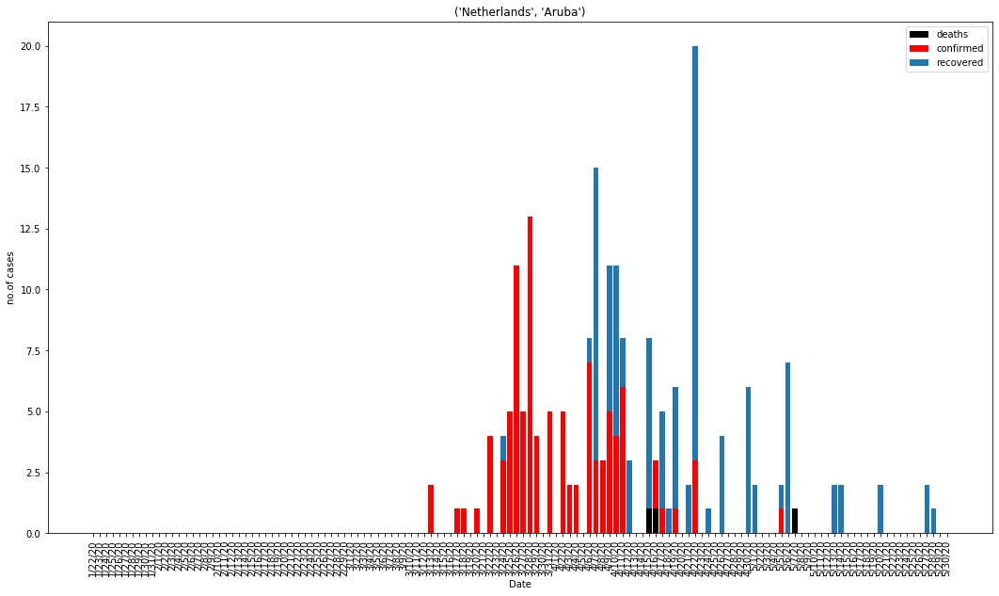

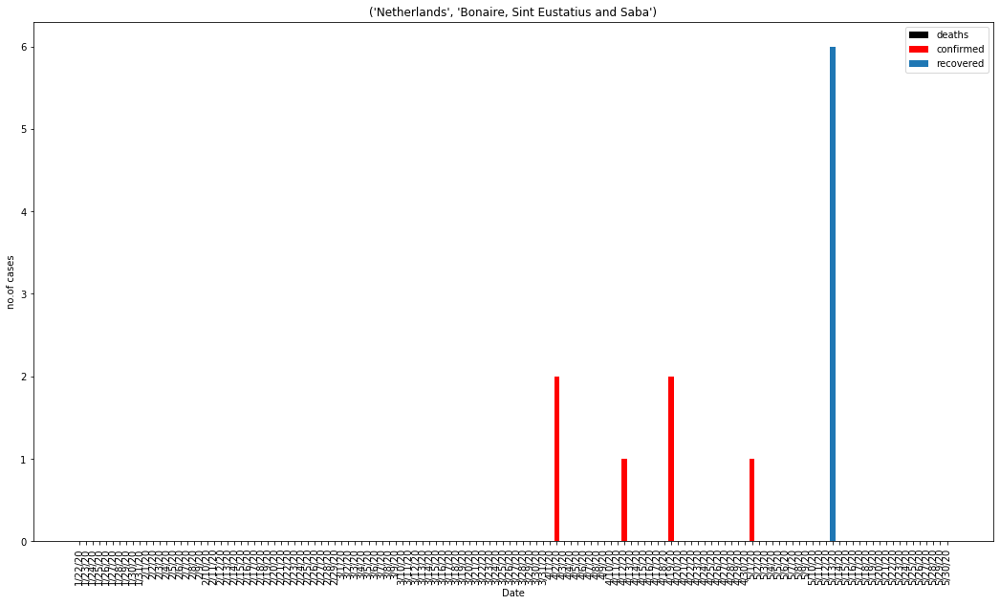

Error in callback <function flush_figures at 0x000002D310404948> (for post_execute):


KeyboardInterrupt: 

In [61]:
for i in idx:
    plt.figure(figsize=(18,10))
    plt.bar(dates,deathst.loc[:,i][2:],color = 'black')
    plt.bar(dates,confirmedt.loc[:,i][2:],bottom=deathst.loc[:,i][2:],color = 'red')
    plt.bar(dates,recoveredt.loc[:,i][2:],bottom=confirmedt.loc[:,i][2:])
    plt.xticks(rotation=90);
    plt.legend(['deaths','confirmed','recovered'])
    plt.xlabel('Date')
    plt.ylabel('no.of cases')
    plt.title(i);

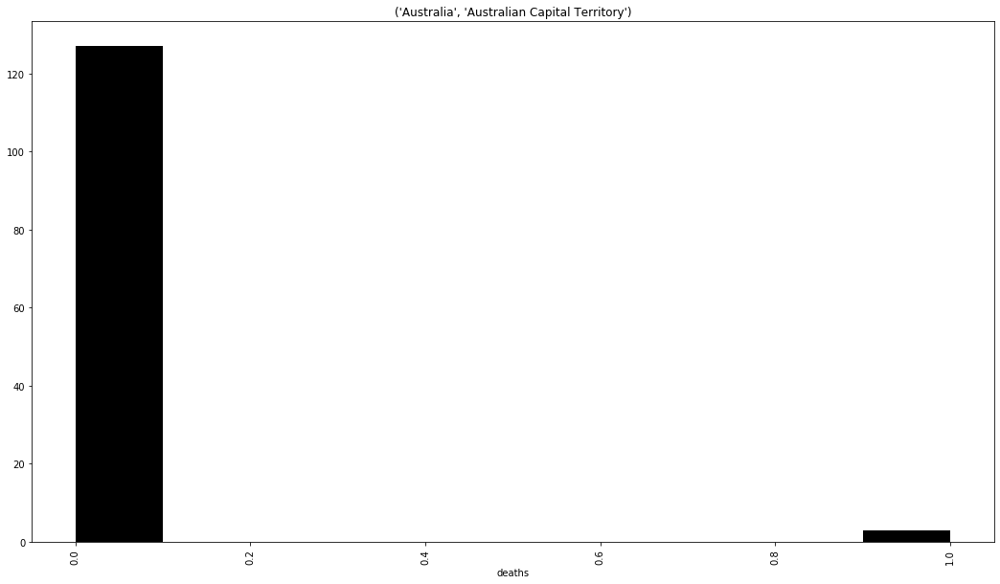

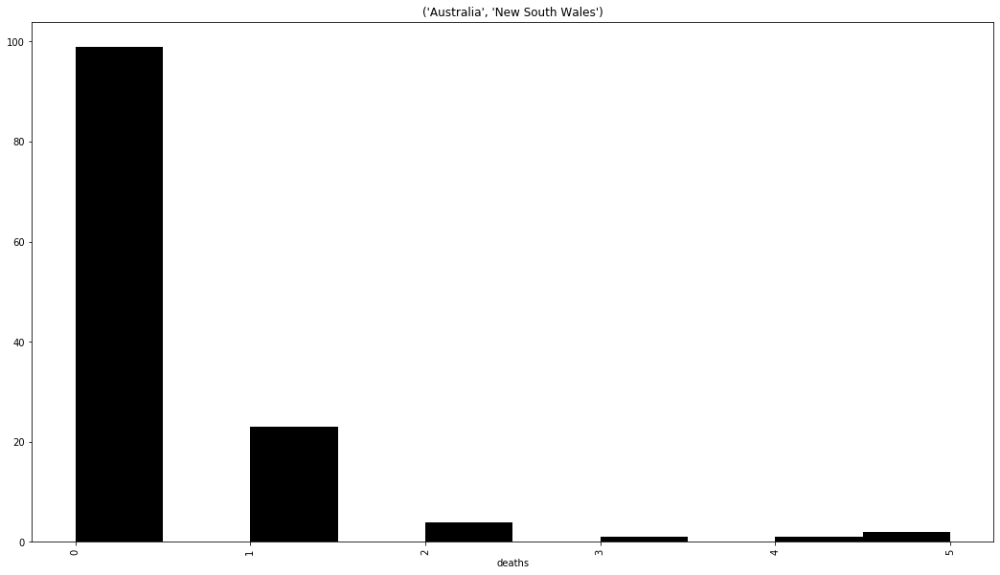

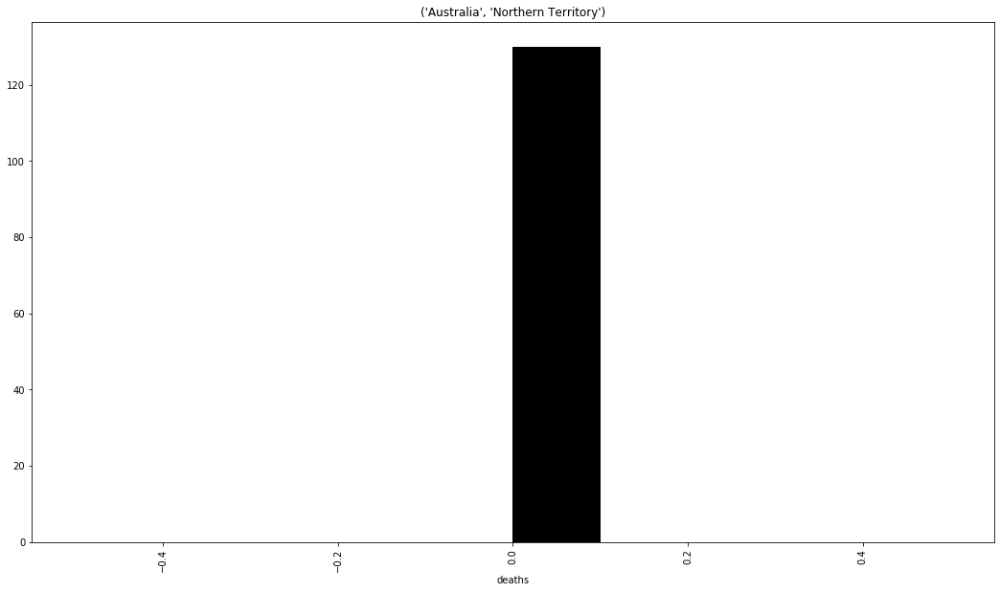

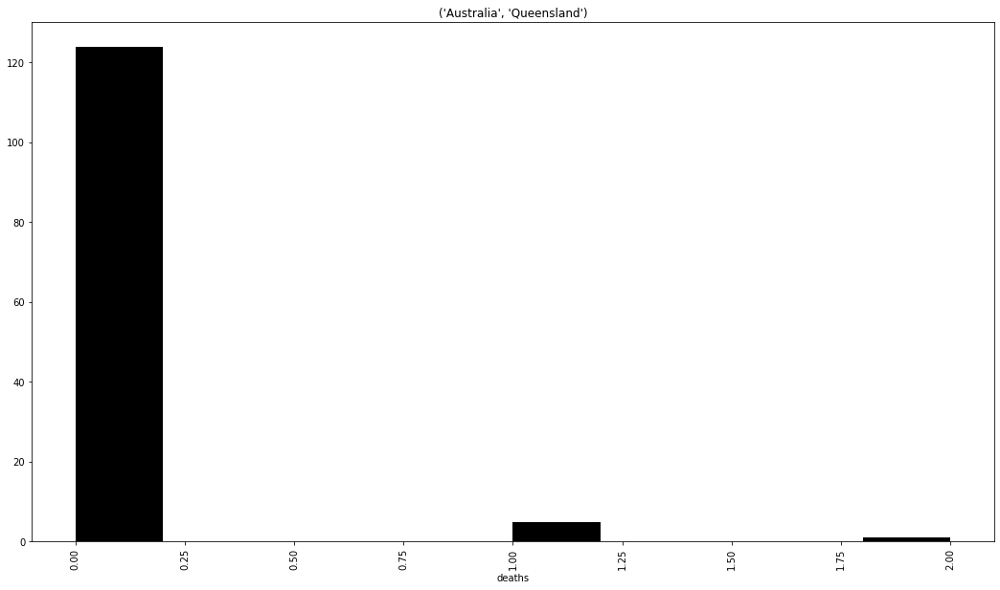

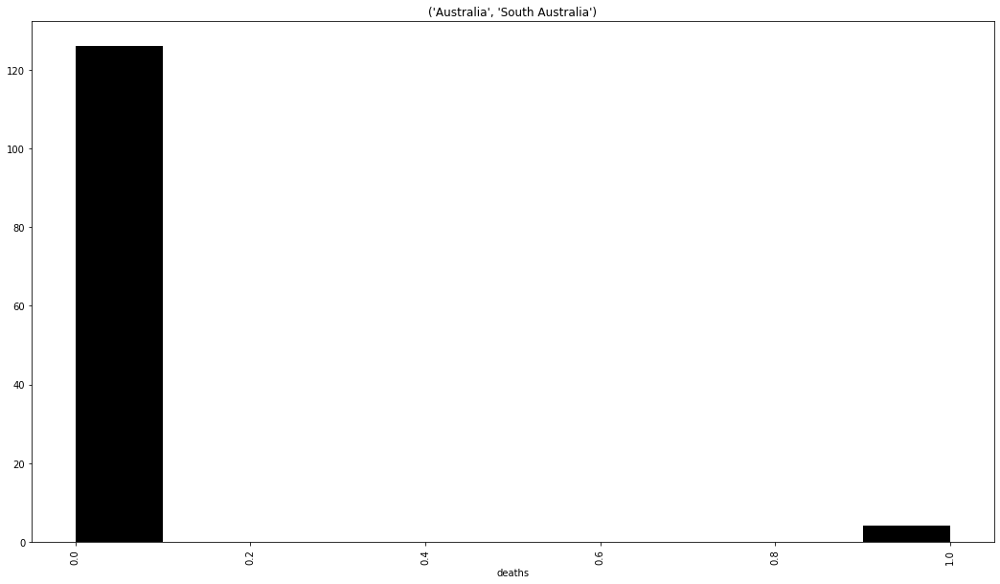

...

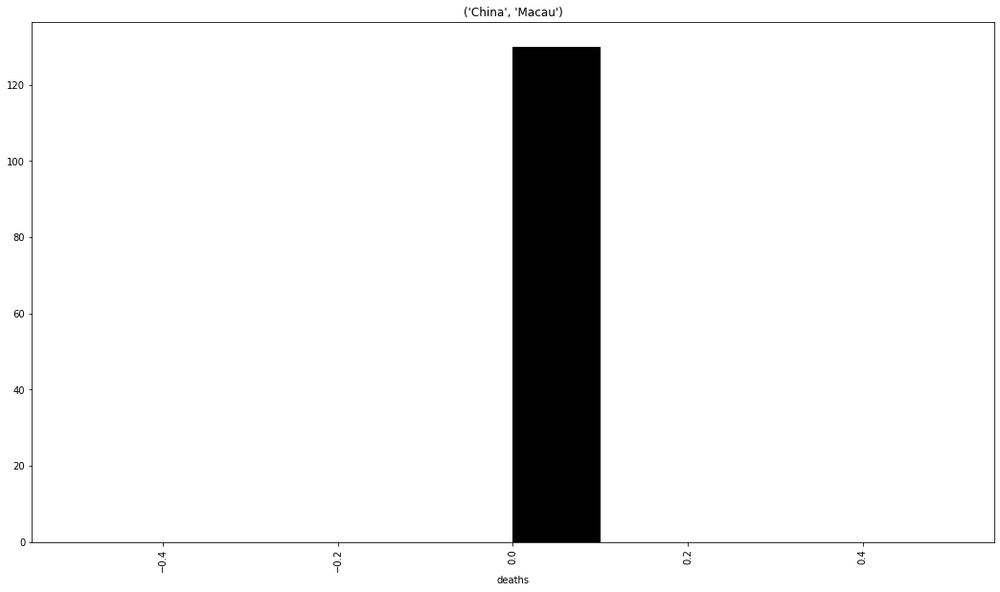

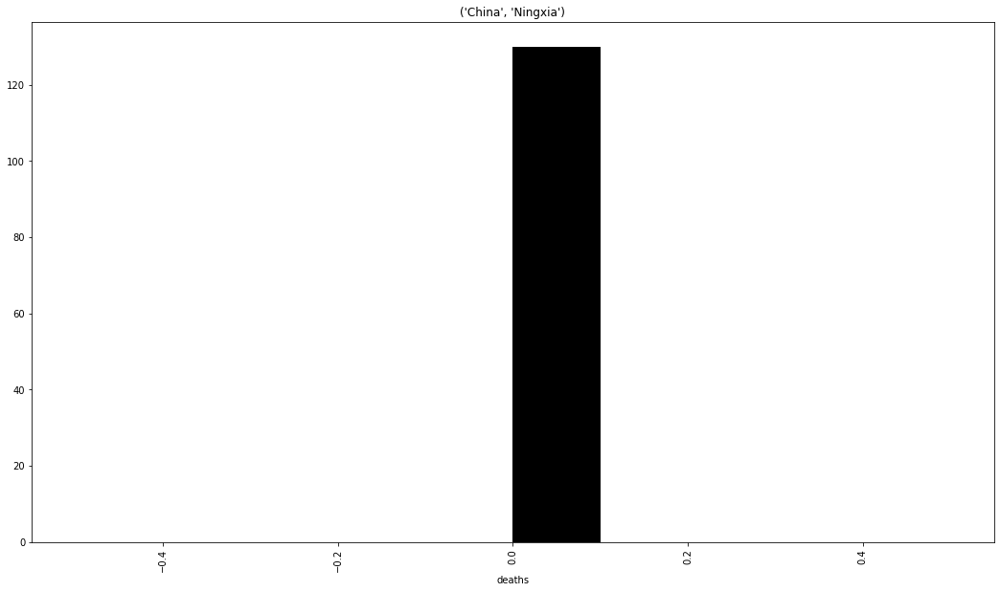

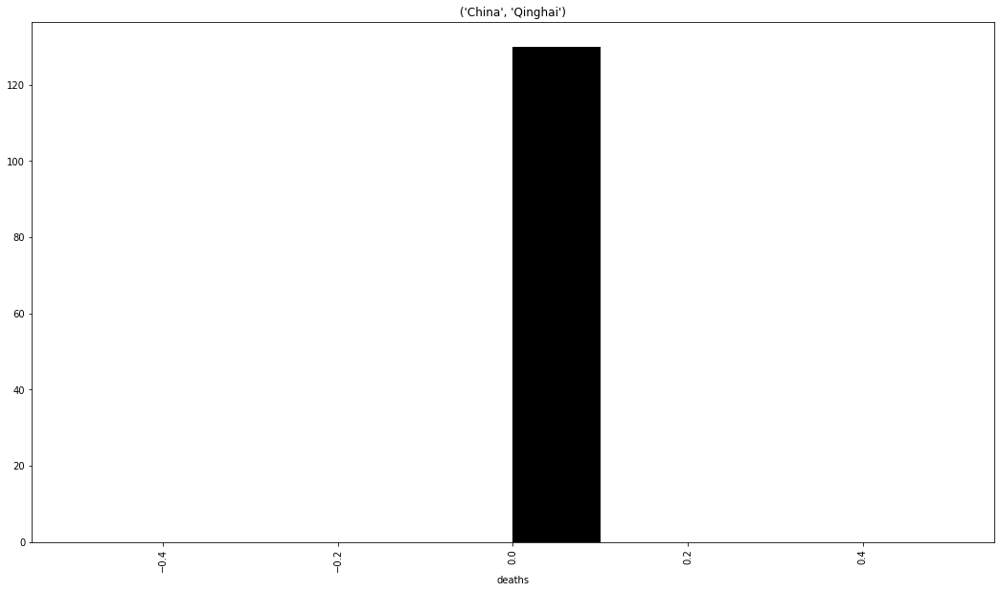

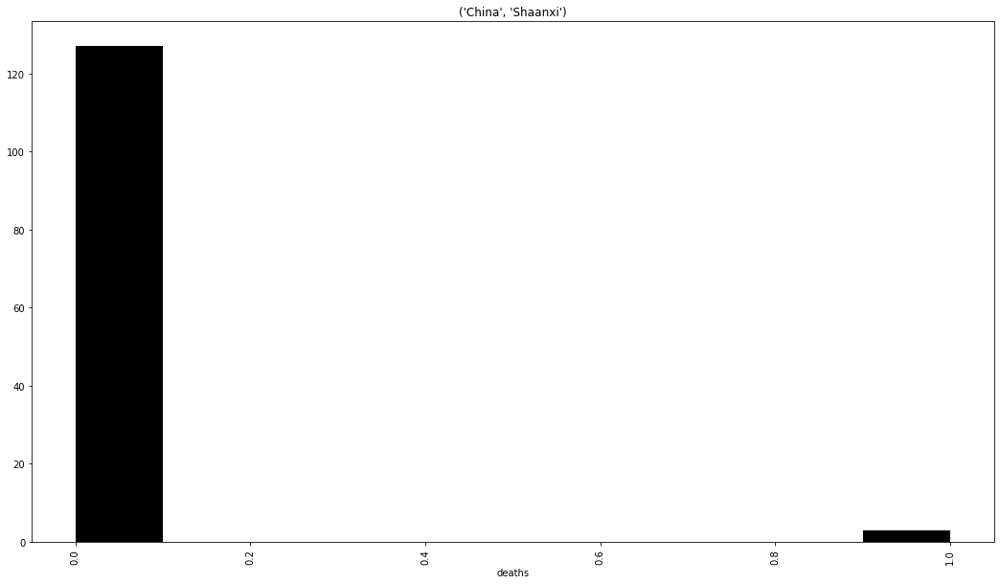

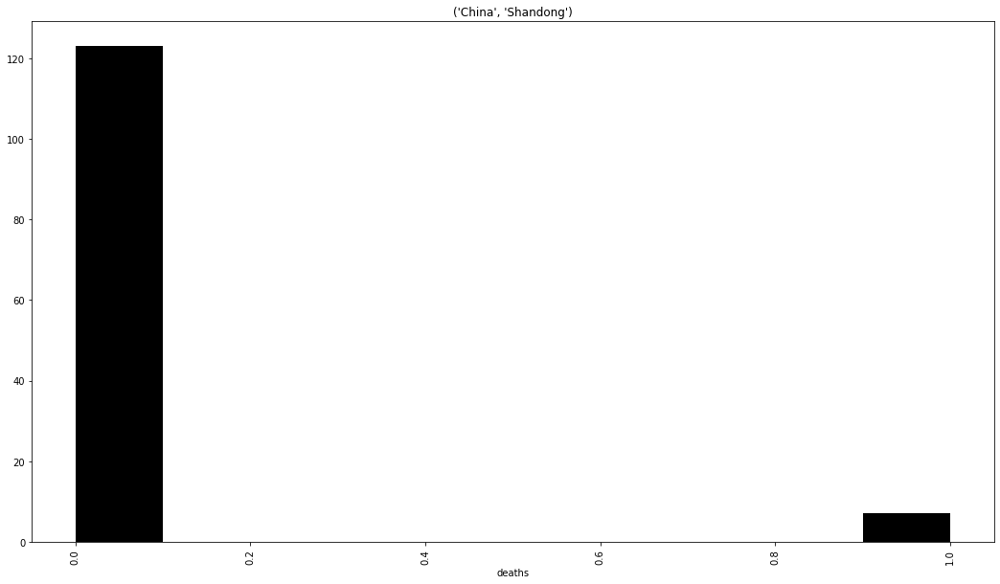

Error in callback <function flush_figures at 0x000002D310404948> (for post_execute):


KeyboardInterrupt: 

In [62]:
for i in idx:
    plt.figure(figsize=(18,10))
    plt.hist(deathst.loc[:,i][2:],color = 'black')
    plt.xticks(rotation=90);
    plt.xlabel('deaths')
    plt.title(i);

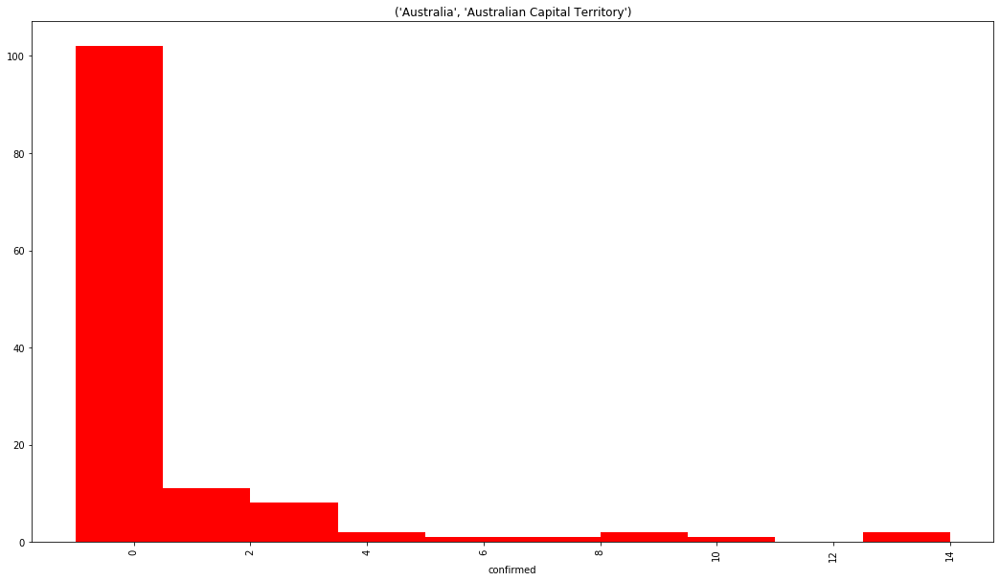

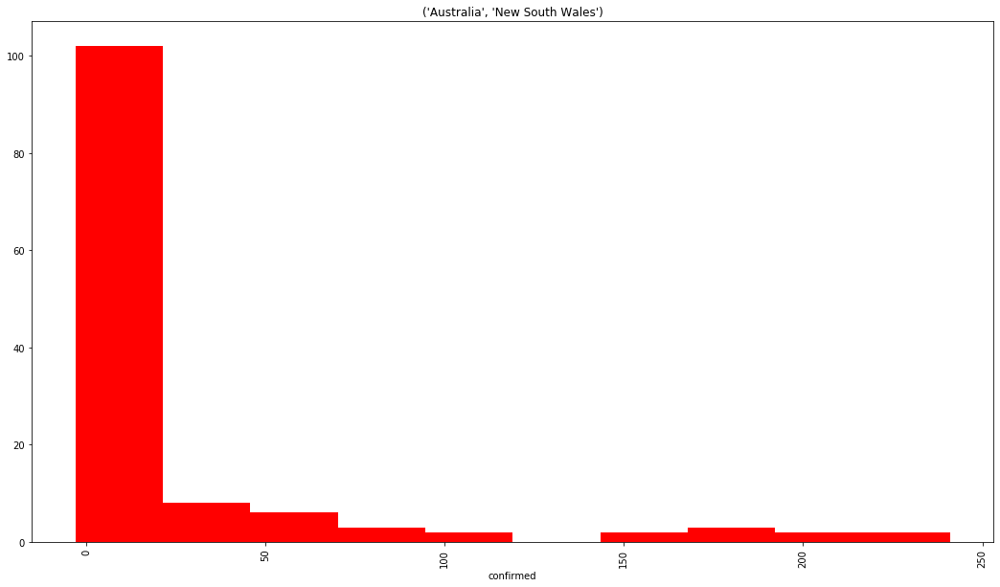

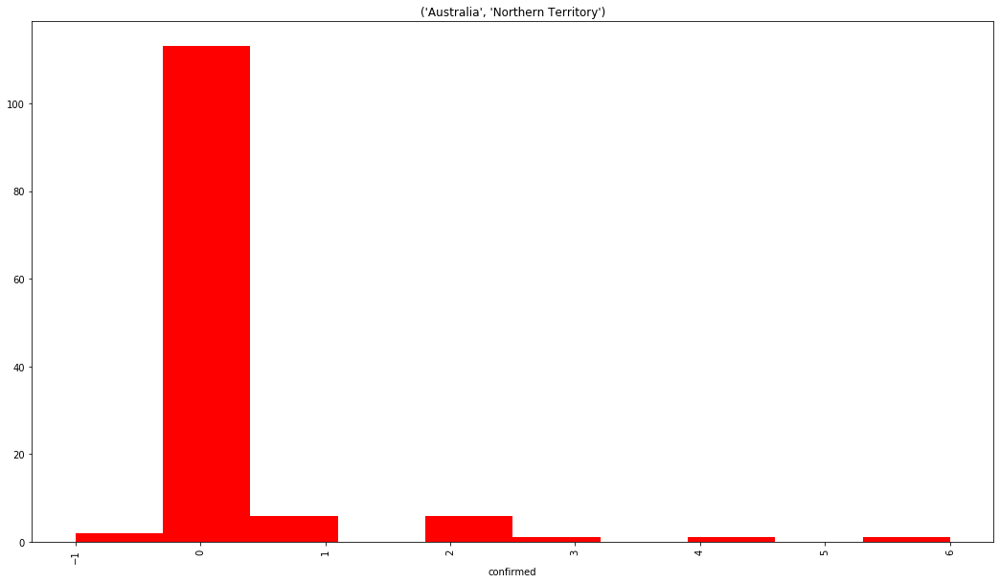

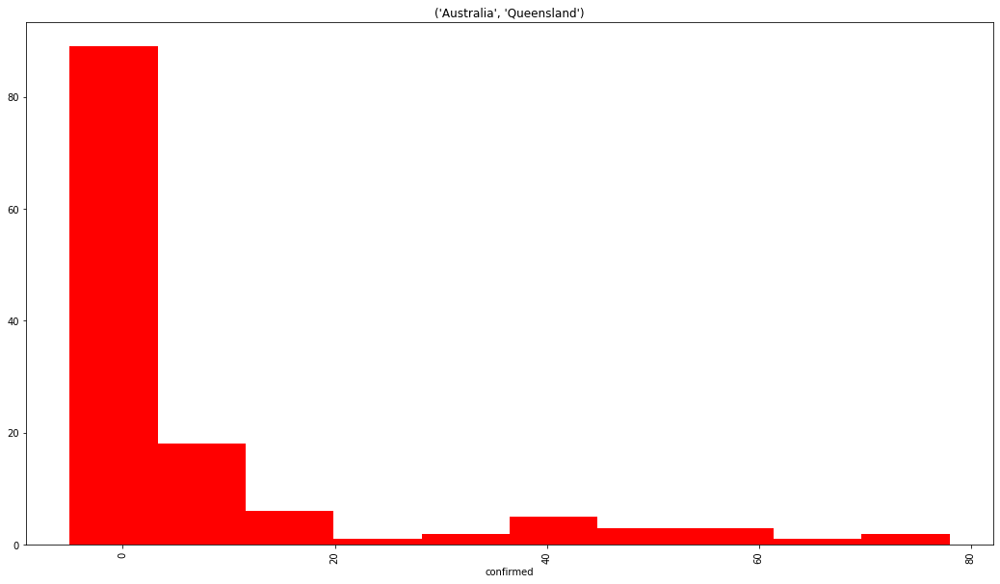

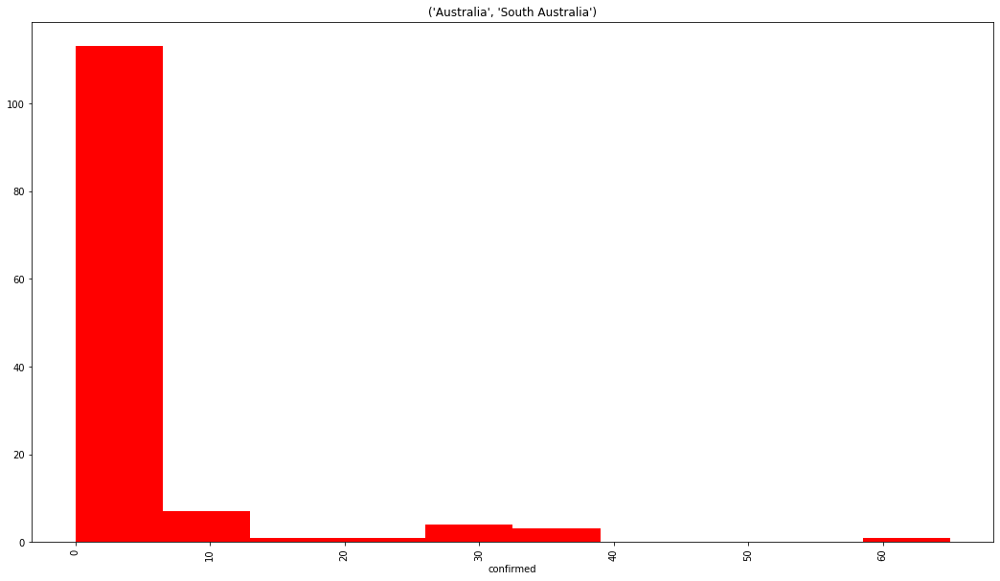

...

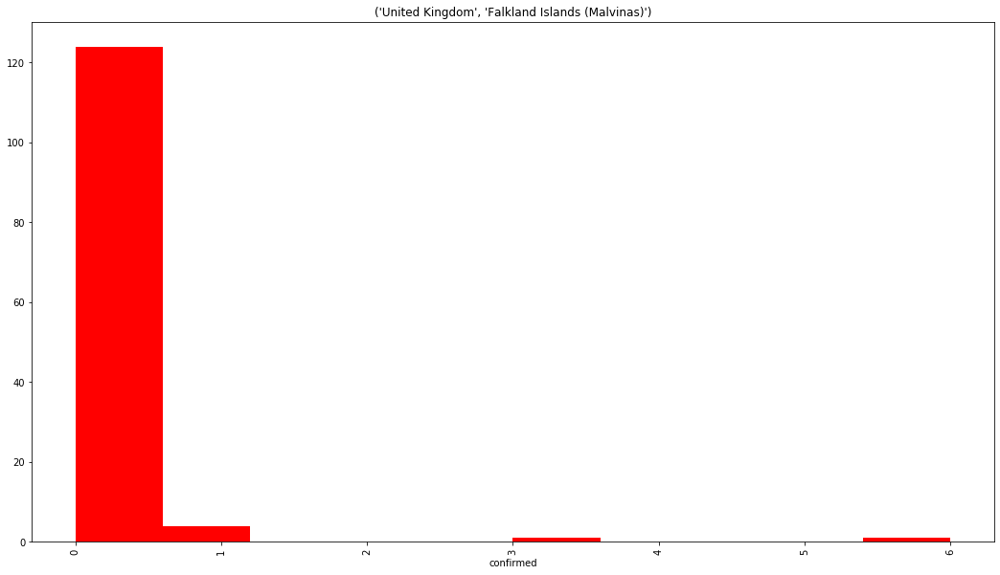

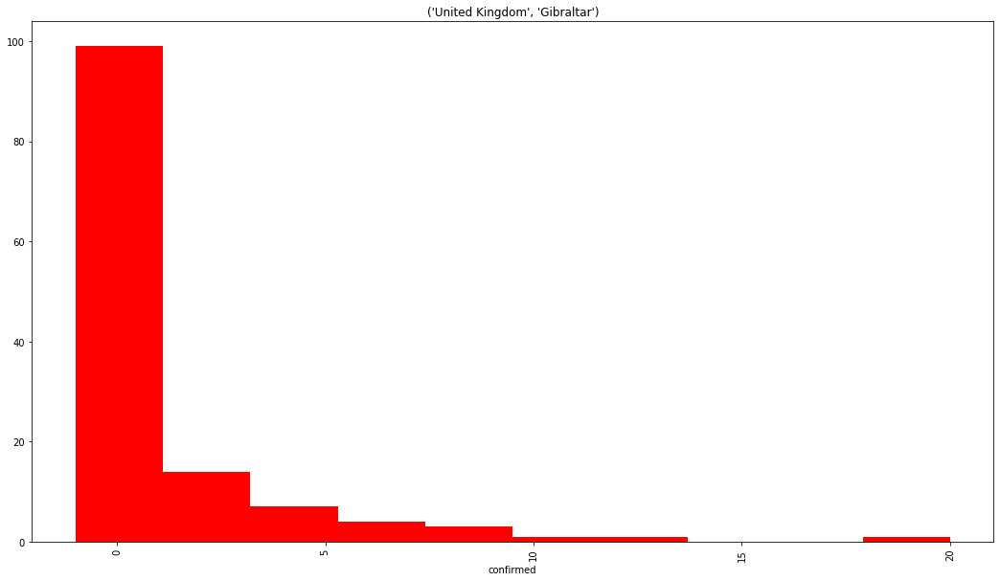

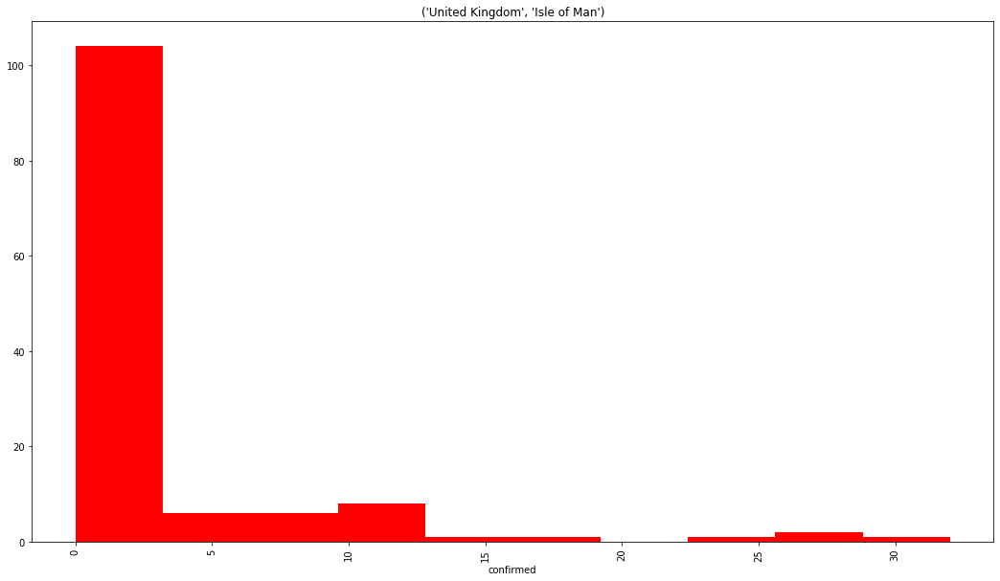

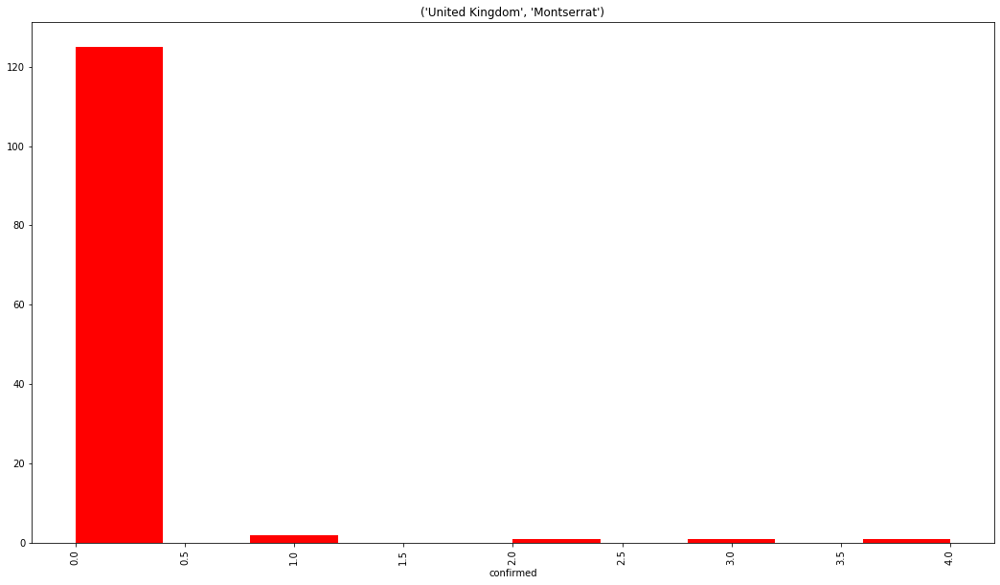

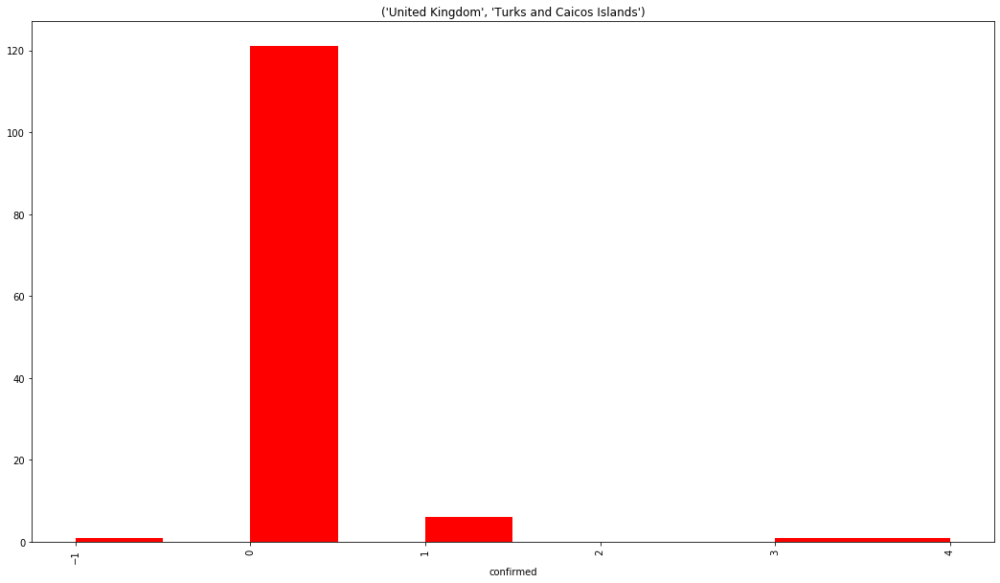

In [67]:
for i in idx:
    plt.figure(figsize=(18,10))
    plt.hist(confirmedt.loc[:,i][2:],color = 'red')
    plt.xticks(rotation=90);
    plt.xlabel('confirmed')
    plt.title(i);

In [ ]:
for i in idx:
    plt.figure(figsize=(18,10))
    plt.hist(recoveredt.loc[:,i][2:],color = 'green')
    plt.xticks(rotation=90);
    plt.xlabel('recovered')
    plt.title(i);

In [ ]:
zc = confirmed.groupby(['Country/Region']).sum()
zr = recovered.groupby(['Country/Region']).sum()
zd = deaths.groupby(['Country/Region']).sum()
confirmedt = zc.transpose()
recoveredt = zr.transpose()
deathst = zd.transpose()
idx = confirmedt.columns.tolist()

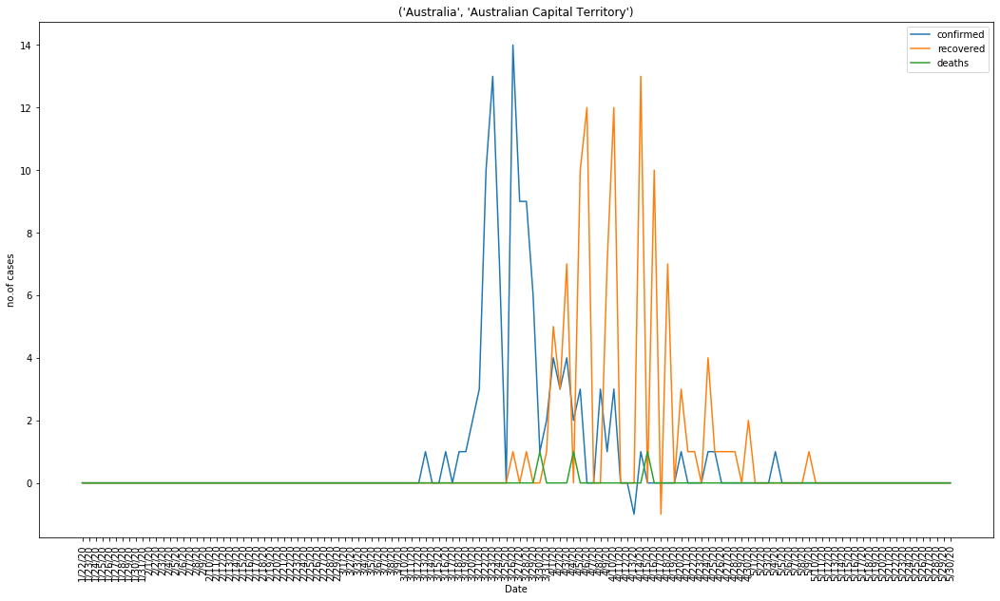

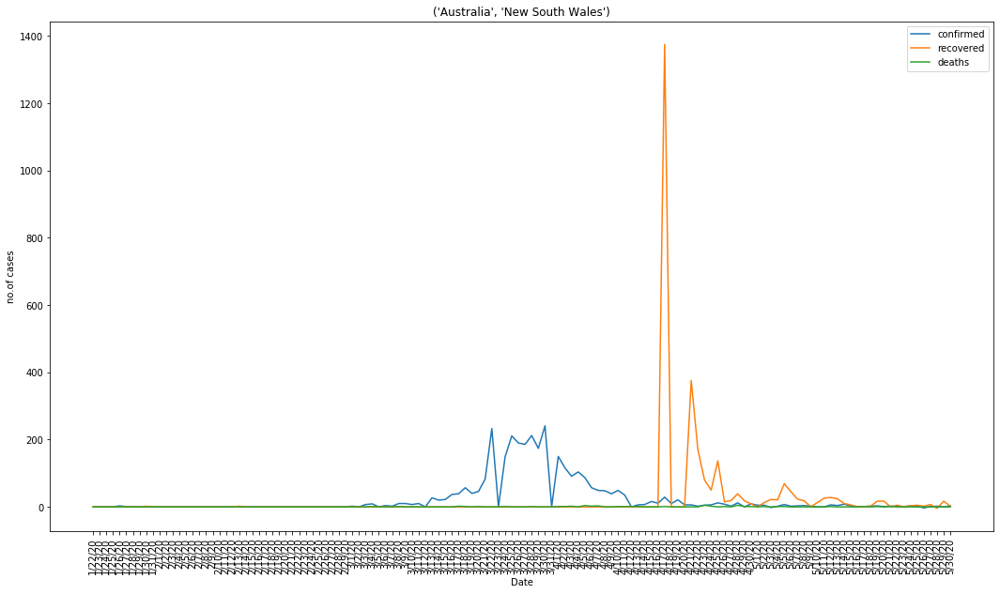

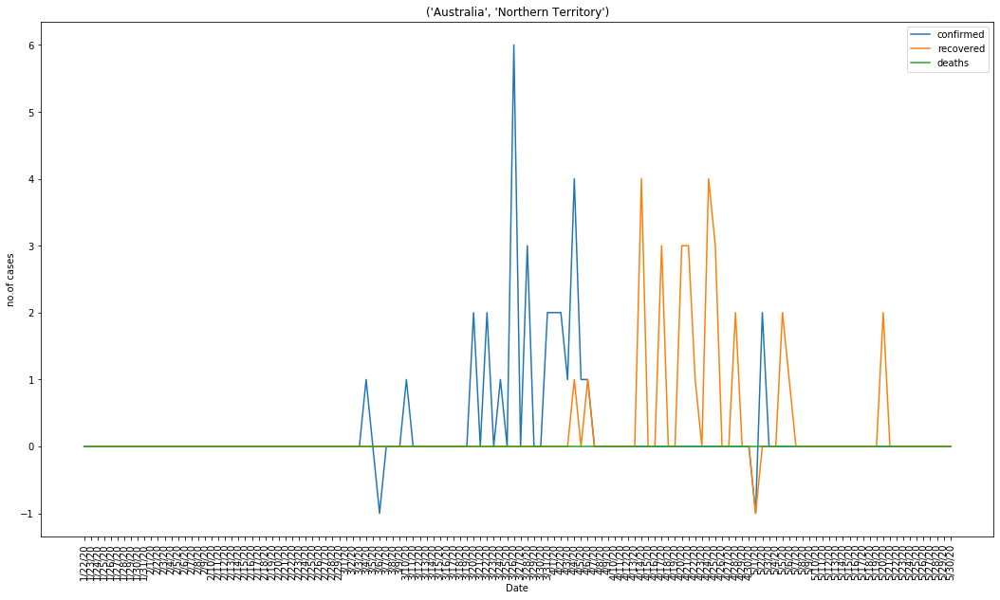

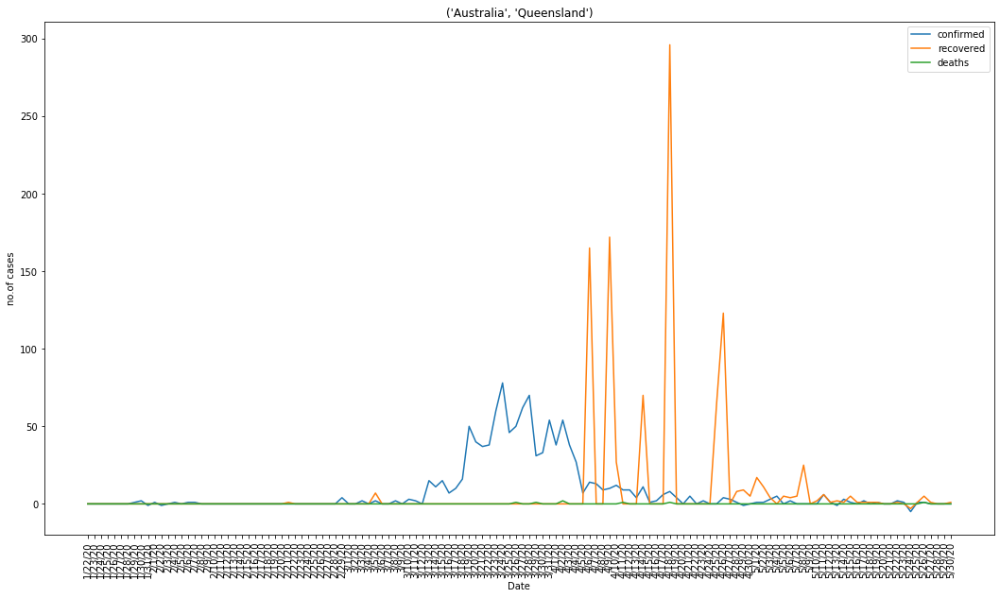

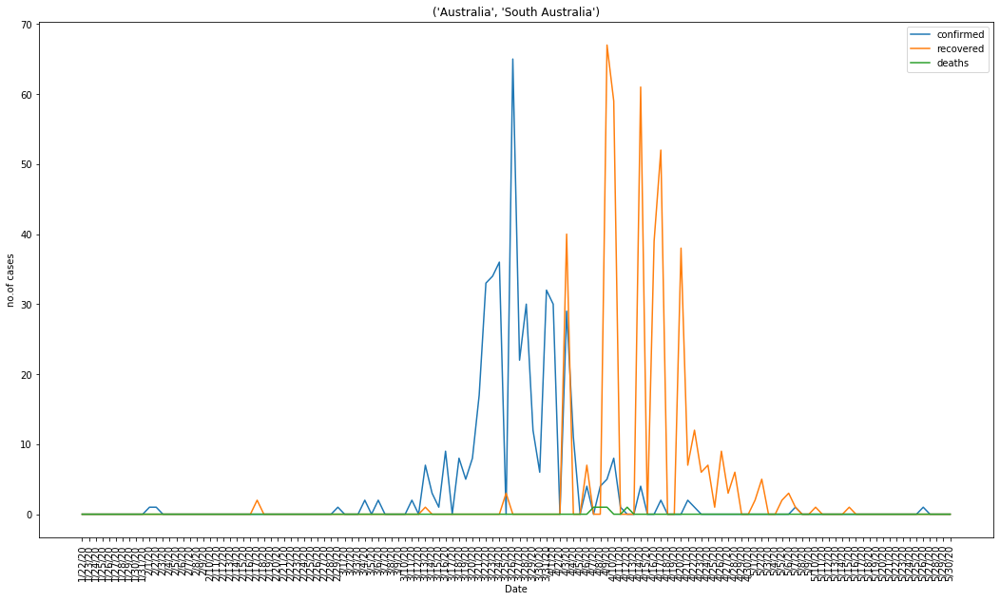

...

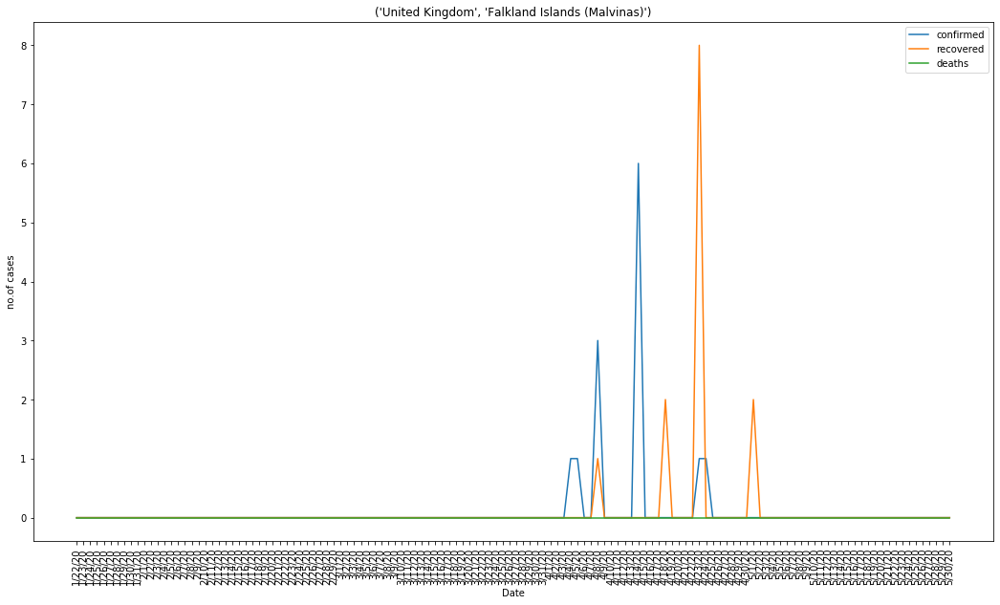

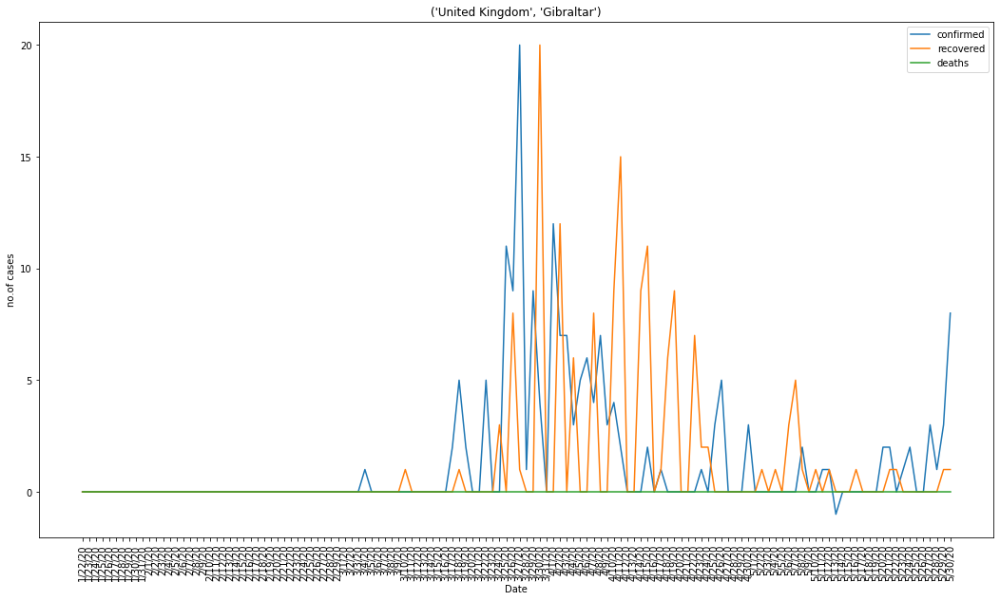

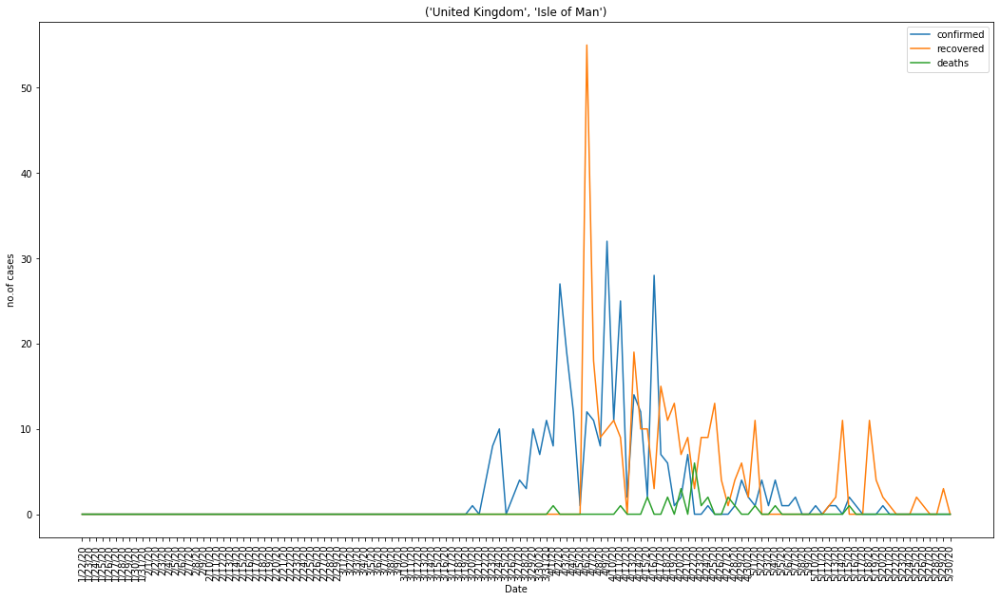

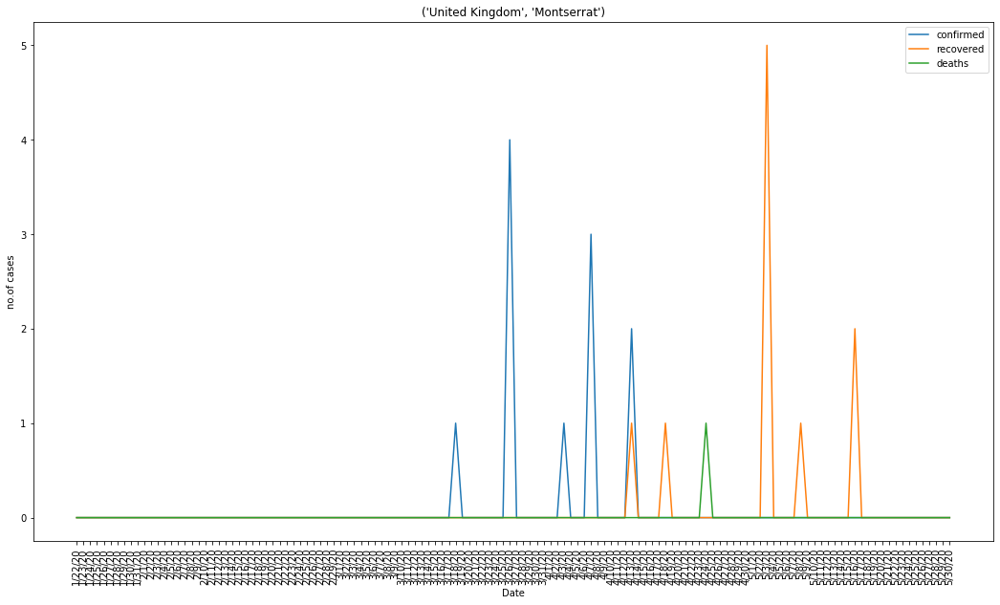

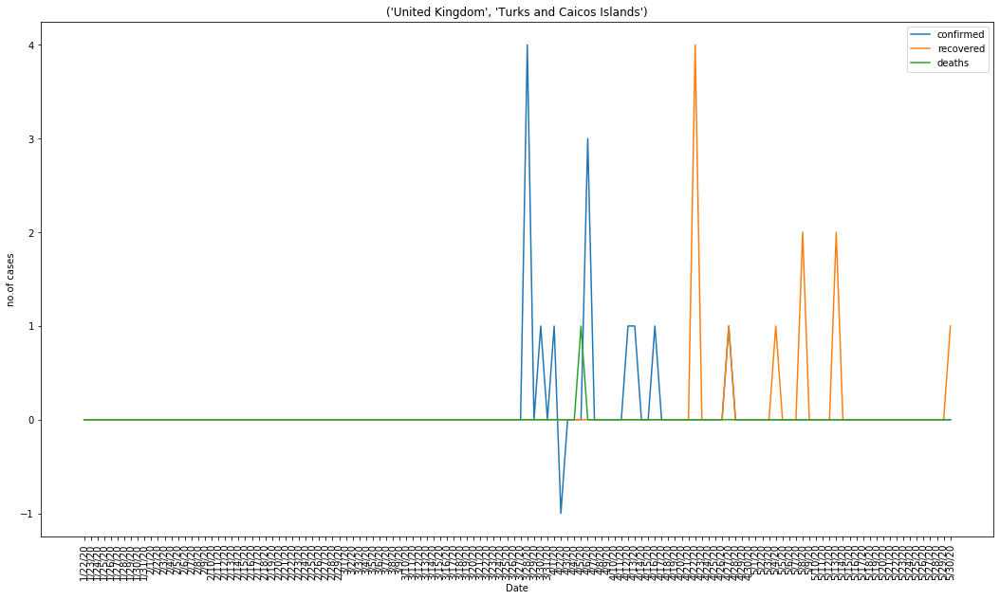

In [68]:
for i in idx:
    plt.figure(figsize=(18,10))
    plt.plot(dates,confirmedt.loc[:,i][2:])
    plt.plot(dates,recoveredt.loc[:,i][2:])
    plt.plot(dates,deathst.loc[:,i][2:])
    plt.xticks(rotation=90);
    plt.legend(['confirmed','recovered','deaths'])
    plt.xlabel('Date')
    plt.ylabel('no.of cases')
    plt.title(i);

In [ ]:
for i in idx:
    plt.figure(figsize=(18,10))
    plt.bar(dates,deathst.loc[:,i][2:],color = 'black')
    plt.bar(dates,confirmedt.loc[:,i][2:],bottom=deathst.loc[:,i][2:],color = 'red')
    plt.bar(dates,recoveredt.loc[:,i][2:],bottom=confirmedt.loc[:,i][2:])
    plt.xticks(rotation=90);
    plt.legend(['deaths','confirmed','recovered'])
    plt.xlabel('Date')
    plt.ylabel('no.of cases')
    plt.title(i);

In [ ]:
for i in idx:
    plt.figure(figsize=(18,10))
    plt.hist(deathst.loc[:,i][2:],color = 'black')
    plt.xticks(rotation=90);
    plt.xlabel('deaths')
    plt.title(i);

In [ ]:
for i in idx:
    plt.figure(figsize=(18,10))
    plt.hist(confirmedt.loc[:,i][2:],color = 'red')
    plt.xticks(rotation=90);
    plt.xlabel('confirmed')
    plt.title(i);

In [ ]:
for i in idx:
    plt.figure(figsize=(18,10))
    plt.hist(recoveredt.loc[:,i][2:],color = 'green')
    plt.xticks(rotation=90);
    plt.xlabel('recovered')
    plt.title(i);